In [281]:
# import mitsuba
import math

from scipy import constants as const

# import drjit
import drjit as dr
import matplotlib.pyplot as plt
import numpy as np

import mitsuba as mi

# colocar el valor de spectral
mi.set_variant("cuda_ad_spectral")

from mitsuba import ScalarTransform4f as T


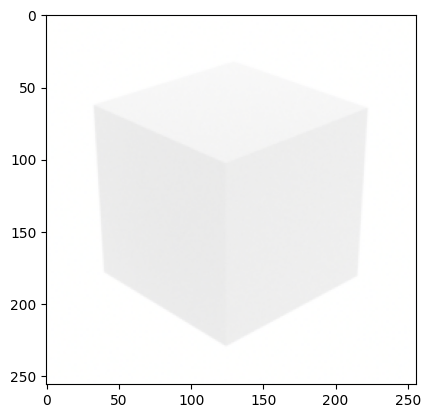

In [282]:
result_path = "../output/static/result/"
static = "../output/static/"

img = plt.imread(result_path + "rgb.png")
plt.imshow(img)
plt.show()

0.0 14.447067
Posición del valor mínimo: (np.int64(0), np.int64(0)) valor: 0.0


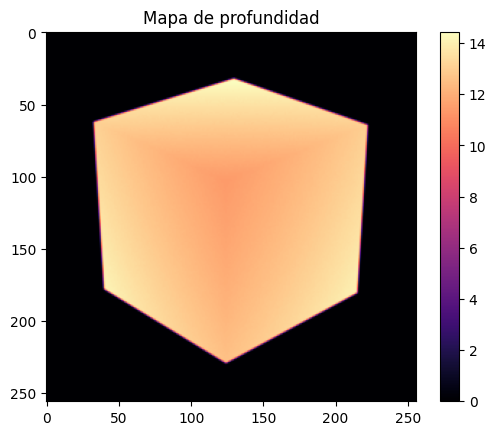

In [283]:
depth = np.load(result_path + "depth.npy")

print(np.min(depth), np.max(depth))

min_pos = np.unravel_index(np.argmin(depth), depth.shape)
print("Posición del valor mínimo:", min_pos, "valor:", depth[min_pos])

plt.imshow(depth, cmap='magma')
plt.title('Mapa de profundidad')
plt.colorbar()

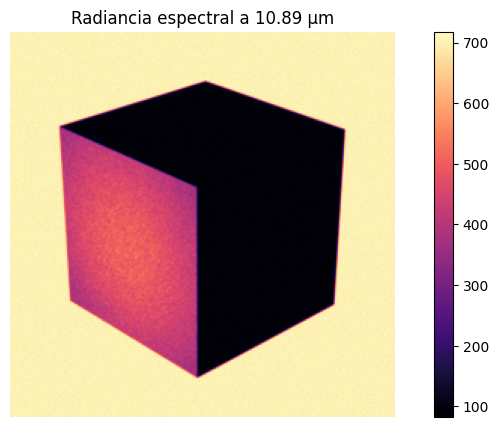

In [284]:
wavelengths = np.linspace(10, 12,10, endpoint=True)
thermal = np.load(result_path + "thermal.npy")

banda = 4

plt.figure(figsize=(10, 5))
plt.imshow(thermal[:, :, banda], cmap='magma')
plt.colorbar()
plt.axis('off')
plt.title(f"Radiancia espectral a {wavelengths[banda]:.2f} µm")
plt.show()

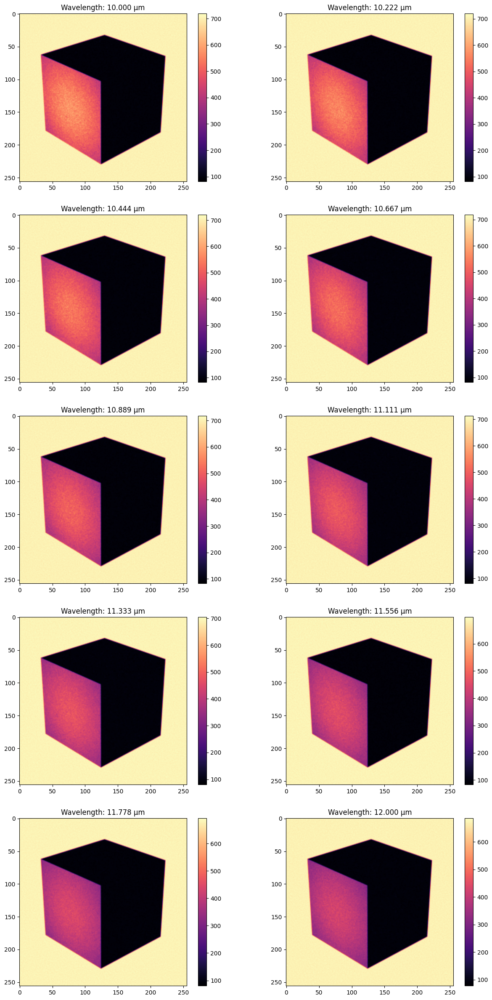

In [285]:


plt.figure(figsize=(15, 30))

for i, wl in enumerate(wavelengths):

    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(thermal[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


Text(0, 0.5, 'Spectral Radiance (μW/cm²/sr/μm)')

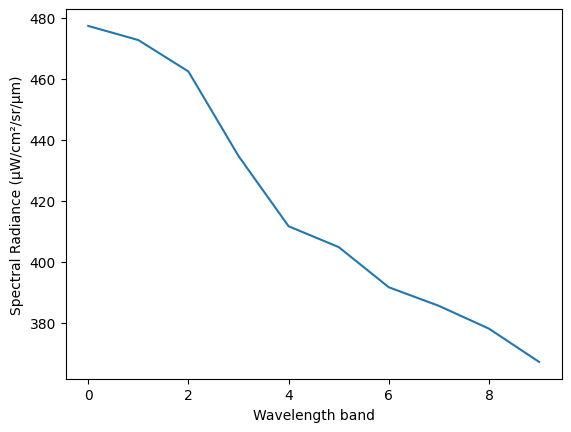

In [286]:
plt.plot(thermal[100, 100, :])
plt.xlabel("Wavelength band")
plt.ylabel("Spectral Radiance (μW/cm²/sr/μm)")

657.0604 720.7059


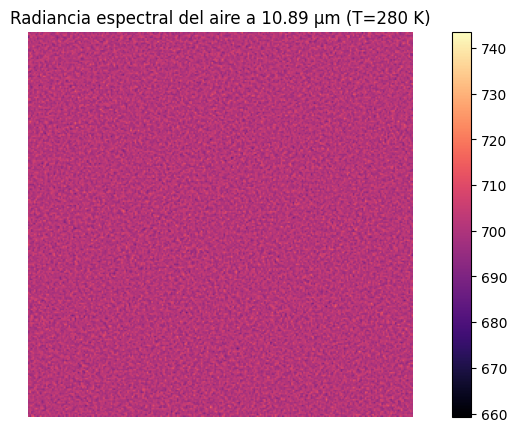

In [287]:
b_air = np.load(result_path + "blackbody_air.npy")
min = np.min(b_air[:,:,banda])
max = np.max(b_air[:,:,banda])
offset = np.sqrt(min)

print(np.min(b_air), np.max(b_air))

plt.figure(figsize=(10, 5))

plt.imshow(b_air[:, :, banda], cmap='magma', vmin=min-offset, vmax=max+offset)
plt.colorbar()
plt.axis('off')
plt.title(f"Radiancia espectral del aire a {wavelengths[banda]:.2f} µm (T=280 K)")
plt.show()


(256, 256, 10)


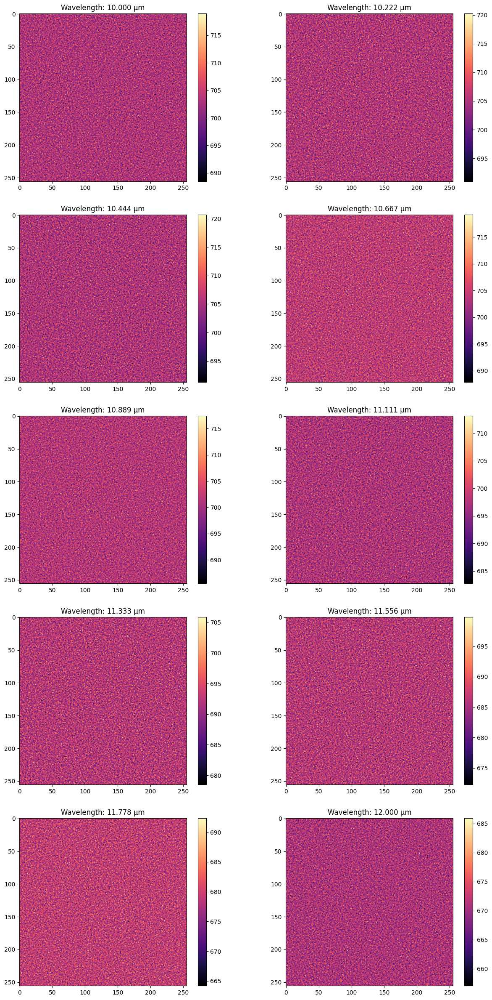

In [288]:


print(b_air.shape)

plt.figure(figsize=(15, 30))
for i, wl in enumerate(wavelengths):

    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(b_air[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


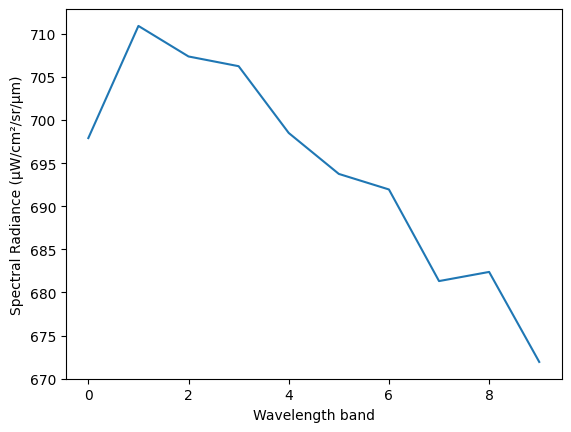

In [289]:
plt.plot(b_air[100, 100, :])
plt.xlabel("Wavelength band")
plt.ylabel("Spectral Radiance (μW/cm²/sr/μm)")
plt.show()

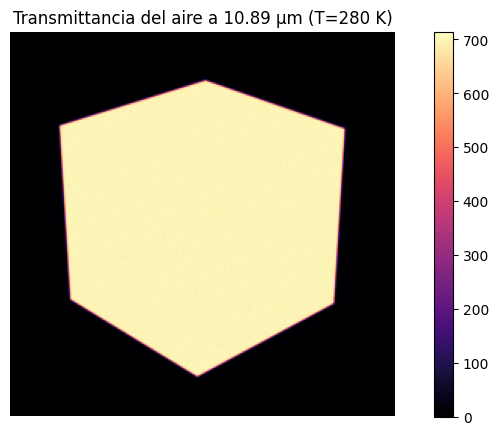

In [290]:
t_b_air = np.load(result_path + "transmittance_blackbody_air.npy")

plt.figure(figsize=(10, 5))
plt.imshow(t_b_air[:, :, banda], cmap='magma')
plt.axis('off')
plt.title(f"Transmittancia del aire a {wavelengths[banda]:.2f} µm (T=280 K)")
plt.colorbar()

(256, 256, 10)
0.0 719.3034


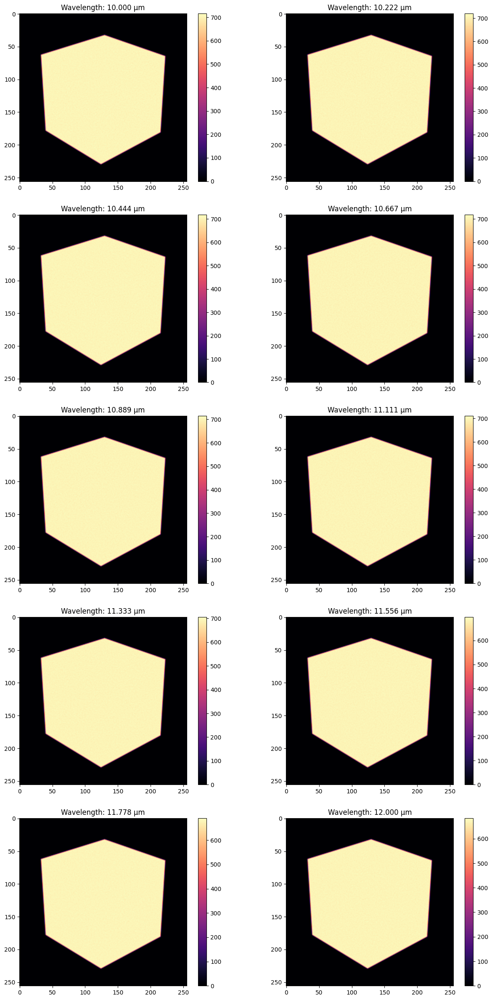

In [291]:


print(t_b_air.shape)

print(np.min(t_b_air), np.max(t_b_air))

plt.figure(figsize=(15, 30))
for i, wl in enumerate(wavelengths):

    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(t_b_air[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


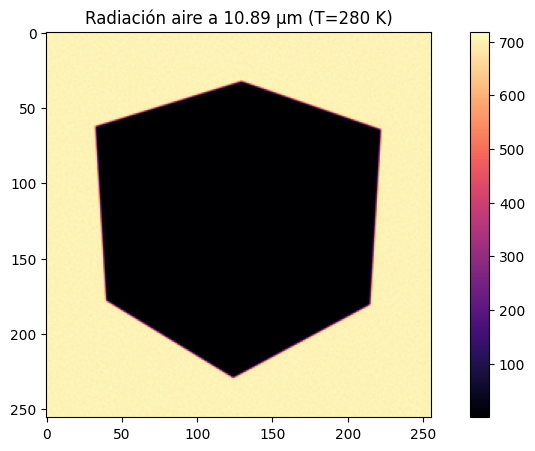

In [292]:
contribution_air = np.load(result_path + "contribution_blackbody_air.npy")

plt.figure(figsize=(10, 5))
plt.imshow(contribution_air[:, :, banda], cmap='magma')
plt.title(f"Radiación aire a {wavelengths[banda]:.2f} µm (T=280 K)")    
plt.colorbar()
plt.show()

-0.57684326 720.7059
(256, 256, 10)


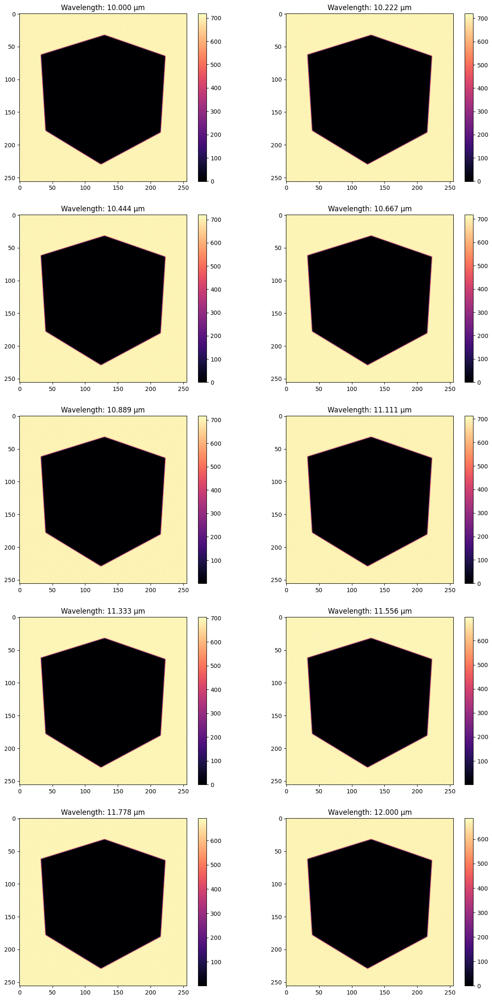

In [293]:
print(np.min(contribution_air), np.max(contribution_air))

print(contribution_air.shape)
plt.figure(figsize=(15, 30))
for i, wl in enumerate(wavelengths):
    
    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(contribution_air[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


0.0 251.21072
(256, 256)


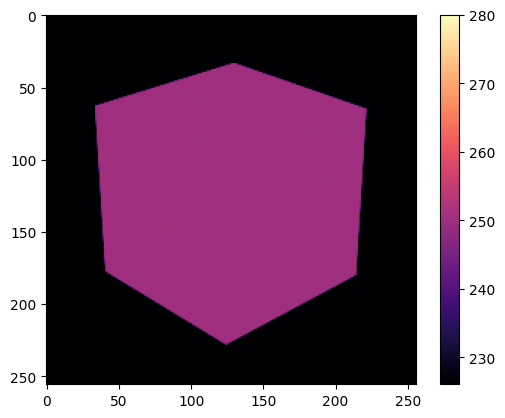

In [294]:
tmap = np.load(result_path + "temperature_map.npy")

print(np.min(tmap), np.max(tmap))

print(tmap.shape)
plt.imshow(tmap, cmap='magma', vmin=280)
plt.colorbar()

(np.float64(0.25), np.float64(16.75))

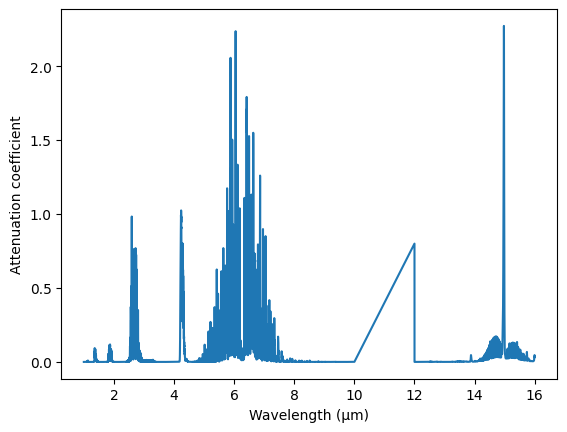

In [295]:
attenuation_air = np.loadtxt(static + "air.txt")

wavelengths = attenuation_air[:, 0]
attenuation = attenuation_air[:, 1].copy()

# Aumentar la atenuación entre 10 y 12 μm hasta un máximo de 2
mask = (wavelengths >= 10) & (wavelengths <= 12)
attenuation[mask] = np.linspace(0, 0.8, mask.sum())

plt.plot(wavelengths, attenuation)
plt.xlabel("Wavelength (μm)")
plt.ylabel("Attenuation coefficient")
plt.xlim()